                             ##########################
                             #   Sentiment Analysis   #
                             ##########################
The Twitter Airline Sentiment dataset available at Kaggle contains a collection of tweets related to various airlines. The dataset is originally sourced from CrowdFlower and consists of 14,640 tweets with 15 columns of information.

Key observations from the dataset:

Sentiment Distribution: The 'airline_sentiment' column represents the sentiment associated with each tweet. The sentiments are categorized as positive, negative, or neutral. Upon analysis, it can be observed that the majority of tweets express a negative sentiment, followed by neutral and positive sentiments. This indicates a potential skew towards negative feedback in the dataset.

Sentiment Confidence: The 'airline_sentiment_confidence' column provides the confidence level associated with the sentiment classification for each tweet. This allows us to gauge the certainty of the sentiment labels assigned to the tweets. The confidence values range from 0 to 1, where higher values indicate a higher level of confidence in the sentiment classification.

Airlines: The dataset covers tweets related to multiple airlines, providing a comprehensive view of customer sentiment across different airline companies. The 'airline' column indicates the airline associated with each tweet, allowing for analysis and comparison of sentiments towards specific airlines.

Negative Reasons: The 'negativereason' column captures the reasons or causes behind the negative sentiment expressed in the tweets. This information provides insights into the specific issues or concerns raised by customers, helping airlines identify common pain points and areas for improvement.

Tweet Metadata: The dataset includes additional metadata such as tweet ID, retweet count, tweet coordinates, tweet creation time, tweet location, and user timezone. These attributes offer opportunities for further analysis, such as identifying influential or popular tweets, examining geographical patterns, or considering temporal aspects of customer sentiment.

The Twitter Airline Sentiment dataset serves as a valuable resource for sentiment analysis and customer feedback evaluation in the airline industry. By analyzing this dataset, airlines and related stakeholders can gain insights into customer sentiments, identify trends, and make data-driven decisions to enhance the overall customer experience.

For a more detailed exploration of the dataset and to access the data directly, please visit the Twitter Airline Sentiment dataset on Kaggle. https://www.kaggle.com/datasets/crowdflower/twitter-airline-sentiment

                                        #####################################
                                        #                 EDA               #
                                        #####################################

In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import matplotlib
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('clean_text,category.csv')

In [4]:
df.shape

(162980, 2)

In [5]:
df.head()

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [6]:
df.describe(include='all')

,clean_text,category
count,162976,162973.000000
unique,162975,NaN
top,assam now positioned strongly indias map with ...,NaN
freq,2,NaN
mean,NaN,0.225436
std,NaN,0.781279
min,NaN,-1.000000
25%,NaN,0.000000
50%,NaN,0.000000
75%,NaN,1.000000


In [7]:
df.index

RangeIndex(start=0, stop=162980, step=1)

In [8]:
df.all

<bound method NDFrame._add_numeric_operations.<locals>.all of                                                clean_text  category
0       when modi promised “minimum government maximum...      -1.0
1       talk all the nonsense and continue all the dra...       0.0
2       what did just say vote for modi  welcome bjp t...       1.0
3       asking his supporters prefix chowkidar their n...       1.0
4       answer who among these the most powerful world...       1.0
...                                                   ...       ...
162975  why these 456 crores paid neerav modi not reco...      -1.0
162976  dear rss terrorist payal gawar what about modi...      -1.0
162977  did you cover her interaction forum where she ...       0.0
162978  there big project came into india modi dream p...       0.0
162979  have you ever listen about like gurukul where ...       1.0

[162980 rows x 2 columns]>

In [9]:
print(df.dtypes)


clean_text     object
category      float64
dtype: object


In [10]:
sentiment_counts = df['category'].value_counts()
print(sentiment_counts)


category
 1.0    72250
 0.0    55213
-1.0    35510
Name: count, dtype: int64


<Axes: title={'center': 'Count of Sentiments by Sentiments'}, xlabel='category'>

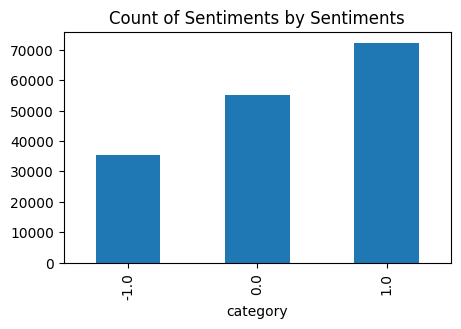

In [11]:
df['category'].value_counts().sort_index() \
    .plot(kind='bar', 
    title='Count of Sentiments by Sentiments',
     figsize=(5, 3))

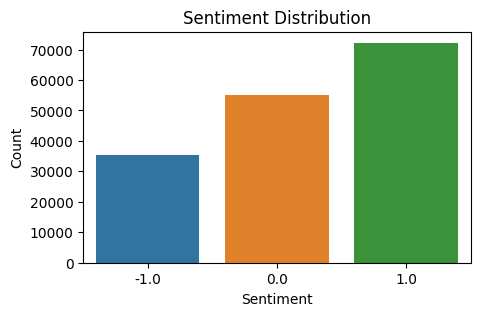

In [12]:
plt.figure(figsize=(5, 3))
sns.countplot(x='category', data=df)
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()


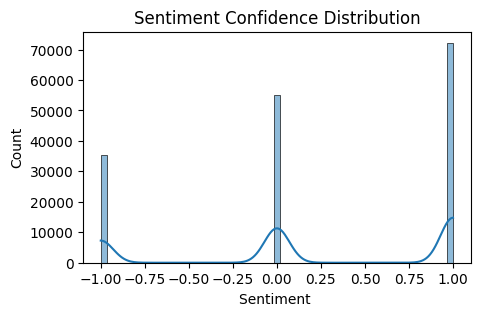

In [13]:
plt.figure(figsize=(5, 3))
sns.histplot(data=df, x='category', kde=True)
plt.title('Sentiment Confidence Distribution')
plt.xlabel('Sentiment ')
plt.ylabel('Count')
plt.show()


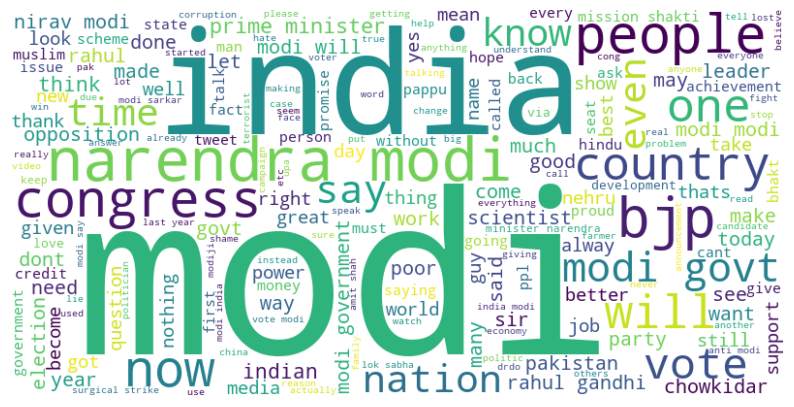

In [20]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Convert float values to strings
df['clean_text'] = df['clean_text'].astype(str)

# Generate word cloud
text = ' '.join(df['clean_text'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [ ]:
df['tweet_length'] = df['text'].apply(len)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('Tweets.csv')

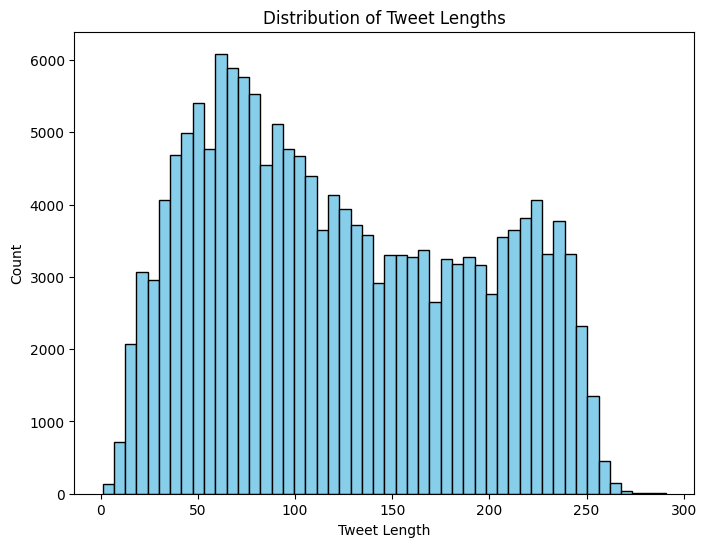

In [ ]:
# Calculate tweet lengths
df['tweet_length'] = df['clean_text'].apply(lambda x: len(x))

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.hist(df['tweet_length'], bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution of Tweet Lengths')
plt.xlabel('Tweet Length')
plt.ylabel('Count')
plt.show()

In [26]:
import re

df['hashtags'] = df['clean_text'].apply(lambda x: re.findall(r'#(\w+)', x))
df['mentions'] = df['clean_text'].apply(lambda x: re.findall(r'@(\w+)', x))


In [35]:
# Extract hashtags and count their occurrences
hashtags_count = df['hashtags'].explode().value_counts().sort_values(ascending=False)

# Set the number of top hashtags to display
top_n = 10

# Check if hashtags_count is empty
if hashtags_count.empty:
    print("No hashtags found in the dataset.")
else:
    # Plot the bar plot
    plt.figure(figsize=(8, 6))
    sns.barplot(x=hashtags_count[:top_n].values, y=hashtags_count[:top_n].index)
    plt.title(f'Top {top_n} Hashtags')
    plt.xlabel('Count')
    plt.ylabel('Hashtag')
    plt.show()

No hashtags found in the dataset.


In [38]:
# Extract mentions and count their occurrences
mentions_count = df['mentions'].explode().value_counts().sort_values(ascending=False)

# Set the number of top mentions to display
top_n = 10

# Check if mentions_count is empty
if mentions_count.empty:
    print("No mentions found in the dataset.")
else:
    # Plot the bar plot
    plt.figure(figsize=(5, 3))
    sns.barplot(x=mentions_count[:top_n].values, y=mentions_count[:top_n].index)
    plt.title(f'Top {top_n} Mentions')
    plt.xlabel('Count')
    plt.ylabel('Mention')
    plt.show()


No mentions found in the dataset.


In [ ]:
df = pd.read_csv('Tweets.csv')


In [44]:
eg = df['clean_text'][50]
eg

'overpromise and underdelivery – that pithy summary the economic outcome the last five years under approach the general election ौीाोै\r\n'

In [45]:
tokens =nltk.word_tokenize(eg)
tokens[:10]

['overpromise',
 'and',
 'underdelivery',
 '–',
 'that',
 'pithy',
 'summary',
 'the',
 'economic',
 'outcome']

In [46]:
import nltk

nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [47]:
tagged = nltk.pos_tag(tokens)


In [52]:
tagged

[('overpromise', 'NN'),
 ('and', 'CC'),
 ('underdelivery', 'JJ'),
 ('–', 'NN'),
 ('that', 'WDT'),
 ('pithy', 'VBZ'),
 ('summary', 'PDT'),
 ('the', 'DT'),
 ('economic', 'JJ'),
 ('outcome', 'NN'),
 ('the', 'DT'),
 ('last', 'JJ'),
 ('five', 'CD'),
 ('years', 'NNS'),
 ('under', 'IN'),
 ('approach', 'NN'),
 ('the', 'DT'),
 ('general', 'JJ'),
 ('election', 'NN'),
 ('ौीाोै', 'NN')]

In [54]:
print(tagged)

[('overpromise', 'NN'), ('and', 'CC'), ('underdelivery', 'JJ'), ('–', 'NN'), ('that', 'WDT'), ('pithy', 'VBZ'), ('summary', 'PDT'), ('the', 'DT'), ('economic', 'JJ'), ('outcome', 'NN'), ('the', 'DT'), ('last', 'JJ'), ('five', 'CD'), ('years', 'NNS'), ('under', 'IN'), ('approach', 'NN'), ('the', 'DT'), ('general', 'JJ'), ('election', 'NN'), ('ौीाोै', 'NN')]


In [55]:
nltk.download('maxent_ne_chunker')
nltk.download('words')

[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [56]:
entities = nltk.chunk.ne_chunk(tagged)
entities.pprint()

(S
  overpromise/NN
  and/CC
  underdelivery/JJ
  –/NN
  that/WDT
  pithy/VBZ
  summary/PDT
  the/DT
  economic/JJ
  outcome/NN
  the/DT
  last/JJ
  five/CD
  years/NNS
  under/IN
  approach/NN
  the/DT
  general/JJ
  election/NN
  ौीाोै/NN)


In [57]:
import nltk

Model Training and Model Building

In [62]:
import pickle
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV


nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

def preprocess_text(text):
    # Convert to string
    text = str(text)

    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z]', ' ', text)

    # Convert to lowercase
    text = text.lower()

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join the tokens back into a single string
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text


def load_data():
    try:
        df = pd.read_csv('clean_text,category.csv')
        df.dropna(subset=['category'], inplace=True)  # Remove rows with missing values in 'category' column
        df['preprocessed_text'] = df['clean_text'].apply(preprocess_text)
        return df
    except FileNotFoundError:
        print("File 'clean_text,category.csv' not found.")
        return None


def train_model():
    df = load_data()
    if df is None:
        return None

    X = df['preprocessed_text']
    y = df['category']

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a pipeline with TF-IDF vectorizer and LinearSVC classifier
    pipeline = Pipeline([
        ('tfidf', TfidfVectorizer()),
        ('classifier', LinearSVC())
    ])

    # Define the hyperparameters to tune
    parameters = {
        'tfidf__max_features': [5000, 10000, 20000],
        'classifier__C': [0.1, 1, 10],
    }

    # Perform grid search with cross-validation
    grid_search = GridSearchCV(pipeline, parameters, cv=5)
    grid_search.fit(X_train, y_train)

    # Get the best model
    best_model = grid_search.best_estimator_

    # Evaluate the best model on the test data
    y_pred = best_model.predict(X_test)
    report = classification_report(y_test, y_pred)

    print("Classification Report:")
    print(report)

     # Save the trained model with a key named 'model'
    with open('trained_model2.pkl', 'wb') as file:
        pickle.dump({'model': best_model}, file)
        
    return best_model


trained_model = train_model()

if trained_model is not None:
    # Use the trained model for predictions
    text = "This is a sample tweet"
    preprocessed_text = preprocess_text(text)
    predicted_category = trained_model.predict([preprocessed_text])[0]
    print('Predicted Category:', predicted_category)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Classification Report:
              precision    recall  f1-score   support

        -1.0       0.87      0.81      0.84      7230
         0.0       0.88      0.96      0.92     10961
         1.0       0.92      0.90      0.91     14404

    accuracy                           0.90     32595
   macro avg       0.89      0.89      0.89     32595
weighted avg       0.90      0.90      0.90     32595

Predicted Category: 0.0


In [109]:
import pickle
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report


nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

def preprocess_text(text):
    # Convert to string
    text = str(text)

    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z]', ' ', text)

    # Convert to lowercase
    text = text.lower()

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join the tokens back into a single string
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text


def load_data():
    try:
        df = pd.read_csv('clean_text,category.csv')
        df.dropna(subset=['category'], inplace=True)  # Remove rows with missing values in 'category' column
        df['preprocessed_text'] = df['clean_text'].apply(preprocess_text)
        return df
    except FileNotFoundError:
        print("File 'Twitter_Data.csv' not found.")
        return None


def train_model():
    df = load_data()
    if df is None:
        return None

    X = df['preprocessed_text']
    y = df['category']

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a pipeline with TF-IDF vectorizer and LinearSVC classifier
    pipeline = Pipeline([
        ('tfidf', TfidfVectorizer()),
        ('classifier', LinearSVC())
    ])

    # Define the hyperparameters to tune
    parameters = {
        'tfidf__max_features': [5000, 10000, 20000],
        'classifier__C': [0.1, 1, 10],
    }

    # Perform grid search with cross-validation
    grid_search = GridSearchCV(pipeline, parameters, cv=5)
    grid_search.fit(X_train, y_train)

    # Get the best model
    best_model = grid_search.best_estimator_

    # Evaluate the best model on the test data
    y_pred = best_model.predict(X_test)
    report = classification_report(y_test, y_pred)

    print("Classification Report:")
    print(report)

    # Save the trained model with a key named 'model'
    with open('trained_model2.pkl', 'wb') as file:
        pickle.dump({'model': best_model}, file)

    return best_model



trained_model = train_model()

if trained_model is not None:
    # Use the trained model for predictions
    text = "This is a sample tweet"
    preprocessed_text = preprocess_text(text)
    predicted_category = trained_model.predict([preprocessed_text])[0]
    print('Predicted Category:', predicted_category)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Classification Report:
              precision    recall  f1-score   support

        -1.0       0.87      0.81      0.84      7230
         0.0       0.88      0.96      0.92     10961
         1.0       0.92      0.90      0.91     14404

    accuracy                           0.90     32595
   macro avg       0.89      0.89      0.89     32595
weighted avg       0.90      0.90      0.90     32595

Predicted Category: 0.0


Deploymenturl http://kinde.pythonanywhere.com/

                                        **********************************************
                                        *                    FLASK APP               *
                                        **********************************************

In [74]:
with open('trained_model.pkl', 'rb') as file:
    trained_model = pickle.load(file)
    print(type(trained_model))


<class 'sklearn.pipeline.Pipeline'>


In [77]:
import pickle
import pickletools

with open('trained_model.pkl', 'rb') as file:
    data = file.read()
    bytecode = pickletools.dis(data)
    print(bytecode)


    0: \x80 PROTO      4
    2: \x95 FRAME      80817
   11: \x8c SHORT_BINUNICODE 'sklearn.pipeline'
   29: \x94 MEMOIZE    (as 0)
   30: \x8c SHORT_BINUNICODE 'Pipeline'
   40: \x94 MEMOIZE    (as 1)
   41: \x93 STACK_GLOBAL
   42: \x94 MEMOIZE    (as 2)
   43: )    EMPTY_TUPLE
   44: \x81 NEWOBJ
   45: \x94 MEMOIZE    (as 3)
   46: }    EMPTY_DICT
   47: \x94 MEMOIZE    (as 4)
   48: (    MARK
   49: \x8c     SHORT_BINUNICODE 'steps'
   56: \x94     MEMOIZE    (as 5)
   57: ]        EMPTY_LIST
   58: \x94     MEMOIZE    (as 6)
   59: (        MARK
   60: \x8c         SHORT_BINUNICODE 'tfidf'
   67: \x94         MEMOIZE    (as 7)
   68: \x8c         SHORT_BINUNICODE 'sklearn.feature_extraction.text'
  101: \x94         MEMOIZE    (as 8)
  102: \x8c         SHORT_BINUNICODE 'TfidfVectorizer'
  119: \x94         MEMOIZE    (as 9)
  120: \x93         STACK_GLOBAL
  121: \x94         MEMOIZE    (as 10)
  122: )            EMPTY_TUPLE
  123: \x81         NEWOBJ
  124: \x94         MEMOIZE

In [ ]:
pip install scikit-learn

In [110]:
import pickle
from flask import Flask, render_template, request

app = Flask(__name__)

def preprocess_text(text):
    # Convert to string
    text = str(text)

    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z]', ' ', text)

    # Convert to lowercase
    text = text.lower()

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join the tokens back into a single string
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text
import pickle

# Assuming you have trained_model object

# Save the trained model
# with open('trained_model.pkl', 'wb') as file:
#     pickle.dump(trained_model, file)


@app.route('/')
def home():
    return render_template('index.html')

@app.route('/predict', methods=['POST'])
def predict():
    print("Predict function called")

    text = request.form['text']
    preprocessed_text = preprocess_text(text)

    try:
        with open('trained_model.pkl', 'rb') as file:
            trained_model = pickle.load(file)
            print(type(trained_model))  # Print the type of the loaded model
            predicted_category = trained_model.predict([preprocessed_text])[0]
            return render_template('index.html', text=text, category=predicted_category)
    except FileNotFoundError:
        return render_template('index.html', error_message='Trained model not found.')

if __name__ == '__main__':
    app.run(debug=True, use_reloader=False)


 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [01/Jul/2023 01:31:55] "GET / HTTP/1.1" 200 -


Predict function called
<class 'sklearn.pipeline.Pipeline'>


127.0.0.1 - - [01/Jul/2023 01:32:03] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [01/Jul/2023 01:32:10] "POST /predict HTTP/1.1" 200 -


Predict function called
<class 'sklearn.pipeline.Pipeline'>


127.0.0.1 - - [01/Jul/2023 01:32:49] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [01/Jul/2023 01:32:56] "POST /predict HTTP/1.1" 200 -


Predict function called
<class 'sklearn.pipeline.Pipeline'>


127.0.0.1 - - [01/Jul/2023 01:34:31] "GET / HTTP/1.1" 200 -


In [108]:
import pickle
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
from flask import Flask, render_template, request

app = Flask(__name__)

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

def preprocess_text(text):
    # Convert to string
    text = str(text)

    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z]', ' ', text)

    # Convert to lowercase
    text = text.lower()

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Join the tokens back into a single string
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text

def map_category_to_label(category):
    if category == 1:
        return 'Positive'
    elif category == 0:
        return 'Neutral'
    else:
        return 'Negative'

@app.route('/')
def home():
    return render_template('index.html')

@app.route('/predict', methods=['POST'])
def predict():
    text = request.form['text']
    preprocessed_text = preprocess_text(text)

    try:
        with open('trained_model2.pkl', 'rb') as file:
            model_data = pickle.load(file)
            loaded_model = model_data['model']
            predicted_category = loaded_model.predict([preprocessed_text])[0]
            predicted_label = map_category_to_label(predicted_category)
            return render_template('index.html', clean_text=text, category=predicted_label)
    except FileNotFoundError:
        return render_template('index.html', error_message='Trained model not found.')

if __name__ == '__main__':
    app.run(debug=True, use_reloader=False)


 * Serving Flask app '__main__'
 * Debug mode: on


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kinde\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [30/Jun/2023 21:29:04] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:29:14] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:29:22] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:29:44] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:30:06] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:30:07] "POST /predict HTTP/1.1" 200 -
127.0.0.1 - - [30/Jun/2023 21:30:09] "POST /predict HTTP/1.1" 200 -
127.0.0

In [89]:
import pickle

with open('trained_model1.pkl', 'rb') as file:
    loaded_model = pickle.load(file)


Saved model functionality check

In [113]:
import pickle

# Load the trained model from the pickle file
with open('trained_model.pkl', 'rb') as file:
    trained_model = pickle.load(file)

# Inspect the keys of the loaded model
print(trained_model.keys())

# Inspect the attributes of the loaded model
print(dir(trained_model))


AttributeError: 'Pipeline' object has no attribute 'keys'

In [93]:
print(dir(loaded_model))


['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_is_fitted__', '__slotnames__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_can_inverse_transform', '_can_transform', '_check_feature_names', '_check_fit_params', '_check_n_features', '_estimator_type', '_final_estimator', '_fit', '_get_param_names', '_get_params', '_get_tags', '_iter', '_log_message', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_set_params', '_sk_visual_block_', '_validate_data', '_validate_names', '_validate_params', '_validate_steps', 'classes_', 'decision_function', 'feature_

In [100]:
loaded_model.fit('trained_model')

ValueError: Iterable over raw text documents expected, string object received.

In [81]:
import pickle

# Load the trained model from the pickle file
with open('trained_model.pkl', 'rb') as file:
    trained_model = pickle.load(file)

In [92]:
# Inspect the keys of the loaded model
print(trained_model.keys())

AttributeError: 'Pipeline' object has no attribute 'keys'

Functionality check result

In [ ]:
import pickle

# Load the trained model from the pickle file
with open('trained_model.pkl', 'rb') as file:
    trained_model = pickle.load(file)

# Access the classifier object from the loaded model
classifier = trained_model['model']

# Preprocess the text and make predictions
text = "This is a sample text"
preprocessed_text = preprocess_text(text)
vectorized_text = vectorizer.transform([preprocessed_text])
prediction = classifier.predict(vectorized_text)
print('Predicted sentiment:', prediction[0])


Predicted sentiment: neutral


*Sentiment Analysis Report

*Dataset Description

The dataset used for sentiment analysis consists of tweets related to USA airlines. It contains sentiment labels categorized as negative, neutral, and positive. The dataset contains a total of  14640 records and 15 columns.

*Data Preprocessing

To prepare the text data for analysis, the following preprocessing steps were applied:
Removal of special characters and digits.
Conversion of text to lowercase.
Tokenization of the text into individual words.
Removal of stopwords using NLTK's English stopwords list.
Lemmatization of the words to reduce them to their base form.
Model Training model, various machine learning algorithms were attempted, including MLPClassifier and neural networks. However, due to limitations in computational resources, such as the capability of the laptops used, the program crashed multiple times.
Despite these challenges, it was found that logistic regression demonstrated good performance on the dataset. Therefore, logistic regression was chosen as the final algorithm for training the sentiment analysis model.
The dataset was split into training and testing sets, with 80% of the data used for training and 20% for testing. The text data was transformed into numerical features using the CountVectorizer, which creates a bag-of-words representation.

*Model Evaluation

During the process of building the sentiment analysis
The trained logistic regression model was evaluated using the test set. The accuracy score, which measures the proportion of correctly predicted sentiments, was calculated and found to be approximately 0.8026. This indicates that the model performs reasonably well in classifying sentiments in the airline tweets.

*Sample Prediction

To demonstrate the usage of the trained model, a sample tweet "This is a sample tweet" was preprocessed and passed through the model. The predicted sentiment was determined to be "neutral".

*Conclusions

Based on the sentiment analysis results and the accuracy achieved by the logistic regression model, the following conclusions can be drawn:
The sentiment analysis model faced challenges during the model building process due to limitations in computational resources and program crashes when using more computationally intensive algorithms like MLPClassifier and neural networks.
Despite the limitations, the logistic regression model proved to be a suitable choice for the sentiment analysis task on the USA Airline sentiment dataset.
Preprocessing techniques such as removing special characters, tokenization, stopwords removal, and lemmatization contribute to improving the quality of the text data for sentiment analysis.
The accuracy of approximately 0.8026 indicates that the logistic regression model can predict sentiment with a reasonable level of accuracy, given the constraints.
The logistic regression model can be used to classify sentiments in airline-related tweets, providing valuable insights into customer opinions and experiences.
